# Atividade Computacional: Fundamentos de Processamento de Imagens

**Aluno:** Fabiano Amaral Alves

## 1. Objetivo da atividade


## 2. Definição das classes

Para esta atividade foram selecionadas as classes **Camisa** e **Calça**. A definição das classes foi realizada seguindo o critério de disponibilidade de diferentes variações.

    > Para as classes escolhidas, cada peça pode apresentar caracteristicas unicas como variações de cor, tamanho, estampas e texturas.

## 3. Aquisição das imagens

Dispositivo utilizado: Smartphone Samsung SM-G780G
Filtros/Embelasamento: Desativados -> Utilizado camera em modo PRO, com ajustes de ISO, Tempo de exposição, entre outros.
Luminosidade: Algumas das imagens foram feitas durante o dia com luz natural, já outras durante a noite com iluminação do ambiente com lampadas de LED ou baixa iluminação.
Distância/Angulo: As fotos foram tiradas a uma distancia entre o objeto principal e o dispositivo de aproximadamente 70 ou 80 centimetros, pois a ideia é capturar o objeto inteiro sendo capaz de obter detalhes de textura presentes no objeto.


| Imagem                                                       | Nome do Arquivo | Classe | Distância | Luminosidade  | Flash      | ISO | Tempo de Exposição |    Ruido/Desfoque |
|--------------------------------------------------------------|-----------------|--------|-----------|---------------|------------|---|--------------------|------------------:|
| <img src="dataset/camisa/camisa1.jpg" width="40" height="30"> | camisa1.jpg     | Camisa | ≈70cm     | Luz Natural   | Não        | 125 | 1/30s              | Não |
| <img src="dataset/camisa/camisa2.jpg" width="40" height="30"> | camisa2.jpg     | Camisa | ≈80cm      | Sombra/Escuro | Não        | 1600 | 1/8s               | Serrilhamento |
| <img src="dataset/camisa/camisa3.jpg" width="40" height="30"> | camisa3.jpg     | Camisa | ≈80cm      | Luz Sintetica | Sim        | 160 | 1/10s              | Não Detectado |
| <img src="dataset/camisa/camisa4.jpg" width="40" height="30"> | camisa4.jpg     | Camisa | ≈80cm      | Luz Sintetica | Não        | 320 | 1/30s              | Não |
| <img src="dataset/camisa/camisa5.jpg" width="40" height="30"> | camisa5.jpg     | Camisa | ≈80cm      | Sombra/Escuro | Não        | 1250 | 1/5s               | Serrilhamento |
| <img src="dataset/calca/calca1.jpg" width="40" height="30">  | calca1.jpg      | Calça  | ≈80cm      | Luz Natural   | Não        | 160 | 1/15s              | Não Detectado |
| <img src="dataset/calca/calca2.jpg" width="40" height="30">  | calca2.jpg      | Calça  | ≈80cm      | Luz Sintetica | Não        | 320 | 1/25s              | Não |
| <img src="dataset/calca/calca3.jpg" width="40" height="30">  | calca3.jpg      | Calça  | ≈80cm      | Luz Natural   | Não | 250 | 1/15s              | Serrilhamento |
| <img src="dataset/calca/calca4.jpg" width="40" height="30">  | calca4.jpg      | Calça  | ≈80cm      | Luz Sintetica | Não | 320 | 1/15s              | Não |
| <img src="dataset/calca/calca5.jpg" width="40" height="30">  | calca5.jpg      | Calça  | ≈80cm      | Sombra/Escuro | Não | 1250 | 1/4s               | Serrilhamento |

O dataset está estruturado por classes como mostrado abaixo:

```text
dataset/
├── camisa/
│   ├── camisa1.jpg
│   ├── camisa2.jpg
│   ├── camisa3.jpg
│   ├── camisa4.jpg
│   └── camisa5.jpg
└── calca/
    ├── calca1.jpg
    ├── calca2.jpg
    ├── calca3.jpg
    ├── calca4.jpg
    └── calca5.jpg
```


## 4. Preparação do ambiente

Principais bibliotecas utilizadas

- **NumPy:**
- **Matplotlib:**
- **OpenCV:**
- **Pillow:**

In [63]:
# Instalação das bibliotecas Matplotlib e OpenCV
!pip install -q matplotlib
!pip install -q opencv-python

print("Dependencias instaladas!")

Dependencias instaladas!


In [64]:
import os
import secrets
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from enum import StrEnum
from PIL.ExifTags import TAGS

print("Tudo OK!")
print("Bibliotecas importadas!")


Tudo OK!
Bibliotecas importadas!


Funções uteis para o desenvolvimento da atividade

In [65]:
class Classe(StrEnum):
    CAMISA="Camisa"
    CALCA="Calça"

def get_caminho_output(nome_arquivo: str, nome_pasta: str = "output") -> str:
    """ Obtem o caminho para um arquivo.

    Args:
        nome_arquivo (str): nome do arquivo
        nome_pasta (str, optional): nome do pasta. Defaults to "output".

    Returns:
        str: caminho do arquivo
    """
    if not os.path.exists(nome_pasta):
        os.makedirs(nome_pasta) # se a pasta especificada ainda não existir, a mesma é criada
    return os.path.join(nome_pasta, nome_arquivo)

def get_imagem_matriz(classe: Classe) -> np.ndarray:
    """Obtem uma imagem em formato de matriz numpy

    Args:
        classe (Classe): classe da imagem

    Returns:
        np.ndarray: imagem em formato de matriz
    """
    if classe == Classe.CAMISA:
        # seleciona uma imagem do dataset de modo aleatorio
        return np.array(Image.open(get_caminho_output(f"camisa{np.random.randint(1,6)}.jpg", "dataset/camisa")))
    return np.array(Image.open(get_caminho_output(f"calca{np.random.randint(1,6)}.jpg", "dataset/calca")))


## 5. Carregamento da imagem

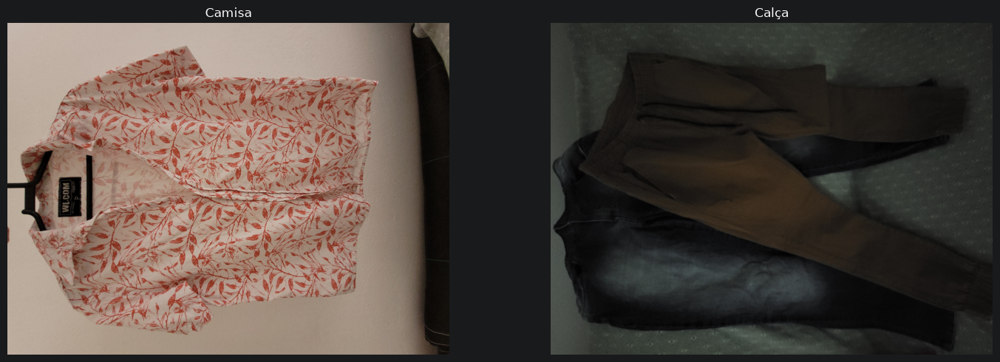

In [77]:
#nome_imagem="imagem"+str(np.random.randint(1, 6))
#print(nome_imagem)
#imagem_camisa_rgb = np.array(Image.open("dataset/camisa/camisa1.jpg"))
#imagem_calca_rgb = np.array(Image.open("dataset/calca/calca1.jpg"))

imagem_camisa_rgb = get_imagem_matriz(Classe.CAMISA)
imagem_calca_rgb = get_imagem_matriz(Classe.CALCA)

fig, eixos = plt.subplots(1, 2, figsize=(15, 5))
eixos[0].imshow(imagem_camisa_rgb)
eixos[0].set_title("Camisa")
eixos[0].axis("off")
eixos[1].imshow(imagem_calca_rgb)
eixos[1].set_title("Calça")
eixos[1].axis("off")
plt.tight_layout()
plt.show()

## 5. Transformações de imagens

### A. Analise de Resolução

Nesta etapa reduzimos a quantidade de pixels nas imagens, logo após ampliaremos as imagens para sua resolução original a partir da imagem reduzida.

A função `modifica_resolucao` possui a logica de redução e reampliação de imagens, o que permite ser utilizada em diferentes cenarios de redução de resolução sem repetir codigo.

In [99]:
def modifica_resolucao(imagem: np.ndarray, proporcao: float, classe: Classe) -> np.ndarray:
    """ Reduz e reamplia as dimensões espaciais da imagem mantendo o tamanho da visualização

    Args:
        imagem (np.ndarray): imagem em formato de matriz
        proporcao (float): proporção da redução em resolução da imagem
        classe: (Classe): classe da imagem

    Returns:
        np.ndarray: imagem em formato de matriz
    """
    altura, largura = imagem.shape[:2]

    porcentagem = np.round(100*proporcao).astype(int) # mostra a porcentagem da redução de resulução

    altura_reduzida = max(1,int(altura * proporcao))
    largura_reduzida = max(1,int(largura * proporcao))

    imagem_reduzida = cv2.resize(imagem, (largura_reduzida, altura_reduzida), interpolation=cv2.INTER_AREA)

    print(f"***** Classe {classe} *****")
    print(f"A imagem original possui {altura}px de altura e {largura}px de largura.")
    print("-----------------------------------------------")
    print(f"Redução da resulução para {porcentagem}% da resulução original!")
    print(f"A imagem reduzida para {porcentagem}% da resulução original possui {imagem_reduzida.shape[0]}px de altura e {imagem_reduzida.shape[1]}px de largura.")
    print(f"----------------------------------------------------------\n")

    imagem_reampliada = cv2.resize(imagem_reduzida, (largura, altura), interpolation=cv2.INTER_NEAREST)

    try:
        Image.fromarray(imagem_reampliada).save(get_caminho_output(f"{"camisa" if classe == Classe.CAMISA else "calca"}_rgb_reducao_{int(proporcao*100)}.jpg", nome_pasta="output/resolucao"))
        print("Imagem reampliada salva com sucesso!\n")
    except Exception as e:
        print("Imagem não salva: \n",e)


    return imagem_reampliada




A seguir implementaremos os cenarios com redução em 50% e 20% da resolução original para cada uma das classes.

***** Classe Camisa *****
A imagem original possui 3000px de altura e 4000px de largura.
-----------------------------------------------
Redução da resulução para 50% da resulução original!
A imagem reduzida para 50% da resulução original possui 1500px de altura e 2000px de largura.
----------------------------------------------------------

Imagem reampliada salva com sucesso!
***** Classe Camisa *****
A imagem original possui 3000px de altura e 4000px de largura.
-----------------------------------------------
Redução da resulução para 20% da resulução original!
A imagem reduzida para 20% da resulução original possui 600px de altura e 800px de largura.
----------------------------------------------------------

Imagem reampliada salva com sucesso!
***** Classe Calça *****
A imagem original possui 3024px de altura e 4032px de largura.
-----------------------------------------------
Redução da resulução para 50% da resulução original!
A imagem reduzida para 50% da resulução original po

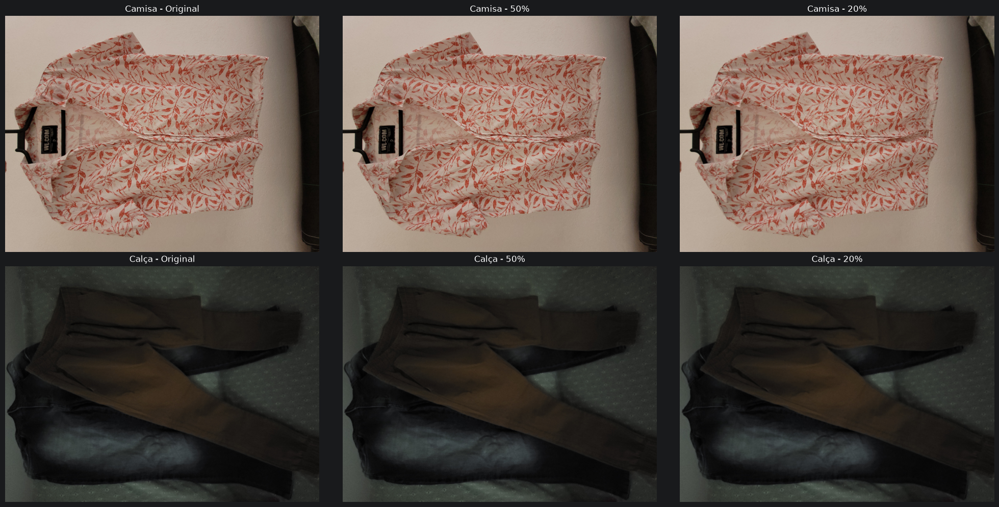

In [98]:
imagens_reampliadas = {
    Classe.CAMISA: [
        imagem_camisa_rgb,
        modifica_resolucao(imagem_camisa_rgb, (50/100), classe=Classe.CAMISA),
        modifica_resolucao(imagem_camisa_rgb, (20/100), classe=Classe.CAMISA)
    ],
    Classe.CALCA: [
        imagem_calca_rgb,
        modifica_resolucao(imagem_calca_rgb, (50/100), classe=Classe.CALCA),
        modifica_resolucao(imagem_calca_rgb, (20/100), classe=Classe.CALCA)
    ]
}

proporcao = ["Original", "50%", "20%"]

fig, eixos = plt.subplots(2, 3, figsize=(20, 10))
for linha, classe in enumerate([Classe.CAMISA, Classe.CALCA]):
    for coluna, prop in enumerate(proporcao):
        eixos[linha, coluna].imshow(imagens_reampliadas[classe][coluna])
        eixos[linha, coluna].set_title(f"{classe} - {prop}")
        eixos[linha, coluna].axis("off")

plt.tight_layout()
plt.show()

#### Analise e interpretação

Como a resolução original das imagens são bastante altas, ao comparar as imagens plotadas em grade nesta seção do notebook sem utilizar o recurso do zoom observou-se apenas o aumento no serrilhamento progressivo entre as imagens com 50% e 20% de redução. Por outro lado, ao analisar as imagens salvas na maquina (com zoom), observou-se perda de detalhes significativa nas imagens com 20% de redução. Mesmo a resolução original sendo alta `3000x4000 px` ao reampliar a imagem a resolução de 20% para a resolução original, detalhes como botões redondos ficaram quadrados, tornando-os dificieis de reconhecer e destinguir de outros objetos como pequenas etiquetas ou botoms. Sendo assim, podemos concluir que reampliar a imagem não recupera os detalhes originais, pois uma vez perdidos o computador não sabe que dado estava ali. Para preencher as informações que faltam o computador cria esses novos pixels baseado no calculo da media entre os pixels vizinhos.

Em tarefas avançadas de visão computacional como modelos detecção de objetos,pois os problemas detectados podem reduzir drasticamente a precisão do modelo, pois os objetos presentes nessas imagens podem não ser reconhecidos pelo modelo ou confundidos com outras classes de objetos a que foi treinado.



### B. Espaços de Cor

Exemplo RGB, HSV e Escala de Cinza para cada classe.

Camisa: RGB -> HSV -> Escala de Cinza

Calça: RGB -> HSV -> Escala de Cinza

#### Separação dos canais RGB



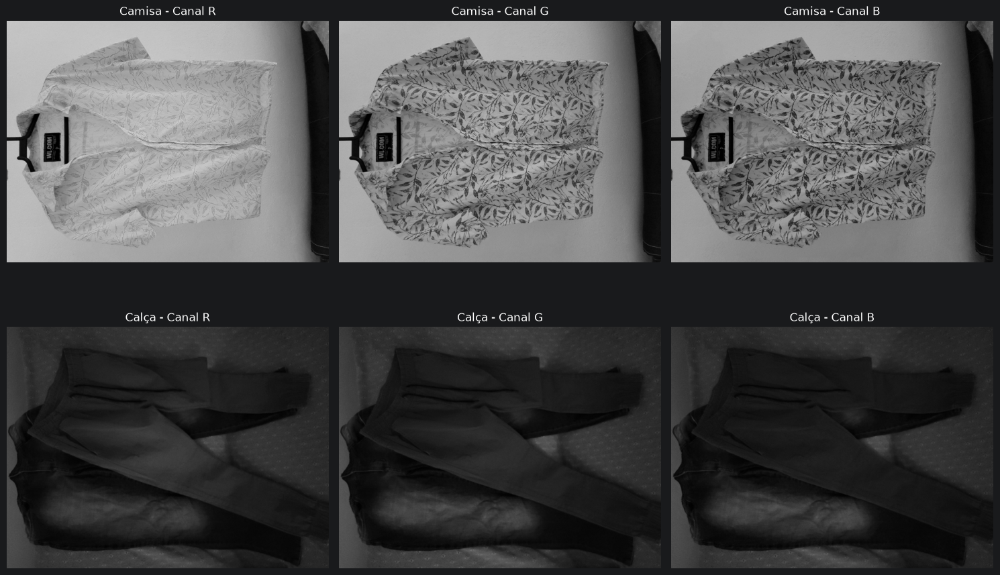

In [100]:
canais_rgb = {
    Classe.CAMISA: [imagem_camisa_rgb[:,:, 0], imagem_camisa_rgb[:,:, 1], imagem_camisa_rgb[:,:, 2]],
    Classe.CALCA: [imagem_calca_rgb[:,:, 0], imagem_calca_rgb[:,:, 1], imagem_calca_rgb[:,:, 2]]
}

nomes_rgb = ["Canal R", "Canal G", "Canal B"]

fig, eixos = plt.subplots(2, 3, figsize=(15, 10))
for linha, classe in enumerate([Classe.CAMISA, Classe.CALCA]):
    for coluna in range(3):
        eixos[linha,coluna].imshow(canais_rgb[classe][coluna], cmap="gray", vmin=0, vmax=255)
        eixos[linha,coluna].set_title(f"{classe} - {nomes_rgb[coluna]}")
        eixos[linha, coluna].axis("off")

plt.tight_layout()
plt.show()

#### Conversão de RGB para escala de cinza

Shape Imagem Camisa em RGB:  (3000, 4000, 3)
Shape Imagem Camisa em Escala de Cinza:  (3000, 4000)
Shape Imagem Calça em RGB:  (3024, 4032, 3)
Shape Imagem Calça em Escala de Cinza:  (3024, 4032)


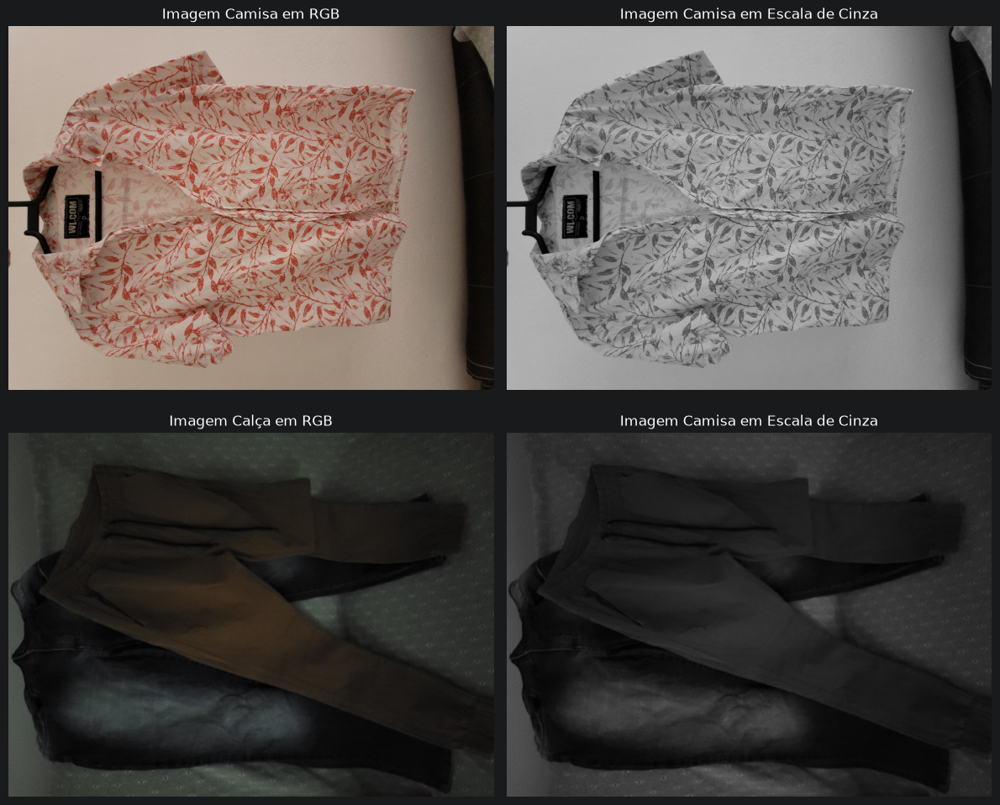

In [81]:
'''Escala de Cinza Classe Camisa'''
imagem_camisa_cinza = cv2.cvtColor(imagem_camisa_rgb, cv2.COLOR_RGB2GRAY)

print("Shape Imagem Camisa em RGB: ", imagem_camisa_rgb.shape)
print("Shape Imagem Camisa em Escala de Cinza: ", imagem_camisa_cinza.shape)

'''Escala de Cinza Classe Calça'''
imagem_calca_cinza = cv2.cvtColor(imagem_calca_rgb, cv2.COLOR_RGB2GRAY)

print("Shape Imagem Calça em RGB: ", imagem_calca_rgb.shape)
print("Shape Imagem Calça em Escala de Cinza: ", imagem_calca_cinza.shape)

fig, eixos = plt.subplots(2, 2, figsize=(12, 10))
eixos[0,0].imshow(imagem_camisa_rgb)
eixos[0,0].set_title("Imagem Camisa em RGB")
eixos[0,0].axis("off")
eixos[0,1].imshow(imagem_camisa_cinza, cmap="gray", vmin=0, vmax=255)
eixos[0,1].set_title("Imagem Camisa em Escala de Cinza")
eixos[0,1].axis("off")
eixos[1,0].imshow(imagem_calca_rgb)
eixos[1,0].set_title("Imagem Calça em RGB")
eixos[1,0].axis("off")
eixos[1,1].imshow(imagem_calca_cinza, cmap="gray", vmin=0, vmax=255)
eixos[1,1].set_title("Imagem Camisa em Escala de Cinza")
eixos[1,1].axis("off")
plt.tight_layout()
plt.show()

#### Conversão de RGB para HSV

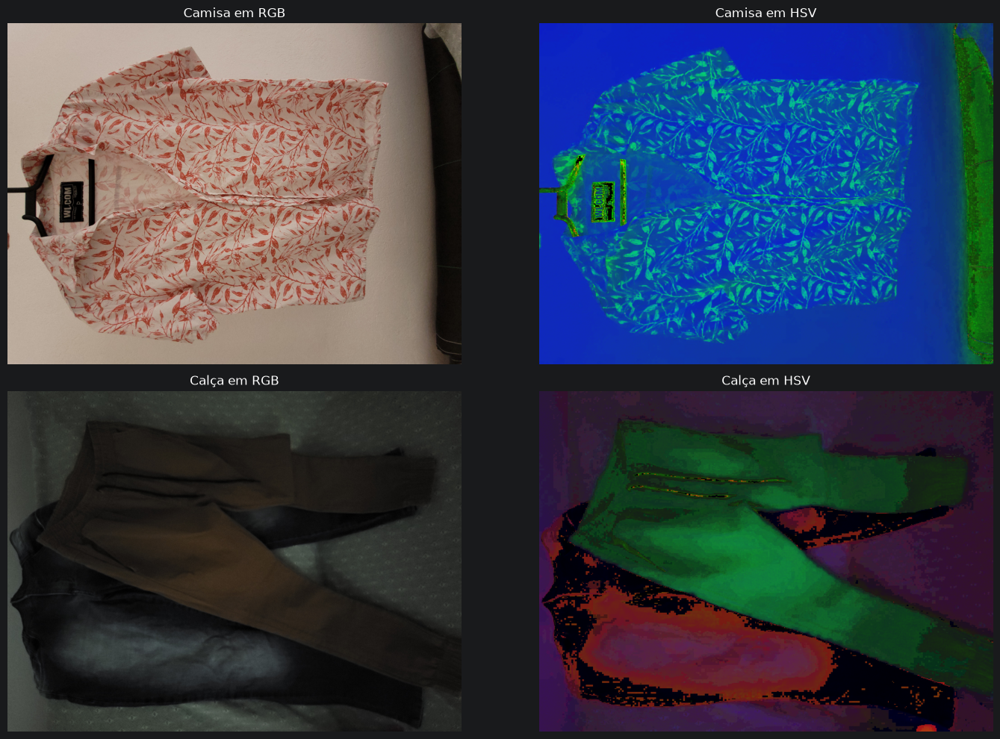

In [82]:
'''HSV Classe Camisa'''

imagem_camisa_hsv = cv2.cvtColor(imagem_camisa_rgb, cv2.COLOR_RGB2HSV)

'''HSV Classe Calça'''
imagem_calca_hsv = cv2.cvtColor(imagem_calca_rgb, cv2.COLOR_RGB2HSV)

fig, eixos = plt.subplots(2, 2, figsize=(15, 10))
eixos[0,0].imshow(imagem_camisa_rgb)
eixos[0,0].set_title("Camisa em RGB")
eixos[0,0].axis("off")
eixos[0,1].imshow(imagem_camisa_hsv, cmap="hsv")
eixos[0,1].set_title("Camisa em HSV")
eixos[0,1].axis("off")
eixos[1,0].imshow(imagem_calca_rgb)
eixos[1,0].set_title("Calça em RGB")
eixos[1,0].axis("off")
eixos[1,1].imshow(imagem_calca_hsv, cmap="hsv")
eixos[1,1].set_title("Calça em HSV")
eixos[1,1].axis("off")
plt.tight_layout()
plt.show()

##### Separação dos canais de cores em HSV

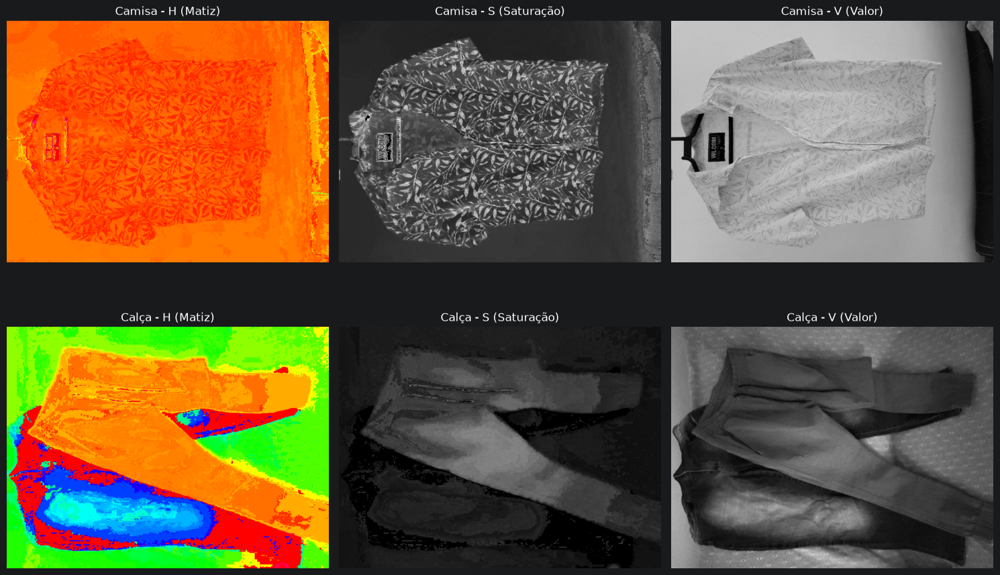

In [102]:
#canal_h_camisa = np.uint8(np.float32(imagem_camisa_hsv[:,:,0]) * (255.0/179.0)) para visualização em escala de cinza



#canal_h_calca = np.uint8(np.float32(imagem_calca_hsv[:,:,0]) * (255.0/179.0)) para visualização em escala de cinza

canais_hsv = {
    Classe.CAMISA: [
        imagem_camisa_hsv[:,:,0],
imagem_camisa_hsv[:,:,1],
imagem_camisa_hsv[:,:,2]
    ],
    Classe.CALCA: [
        imagem_calca_hsv[:,:,0],
imagem_calca_hsv[:,:,1],
imagem_calca_hsv[:,:,2]
    ]
}

nomes_hsv = ["H (Matiz)", "S (Saturação)","V (Valor)"]

fig, eixos = plt.subplots(2, 3, figsize=(15, 10))
for linha, classe in enumerate([Classe.CAMISA, Classe.CALCA]):
    for coluna in range(3):
        eixos[linha,coluna].imshow(canais_hsv[classe][coluna], cmap=f"{"hsv" if nomes_hsv[coluna] == "H (Matiz)" else "gray"}" )
        eixos[linha,coluna].set_title(f"{classe} - {nomes_hsv[coluna]}")
        eixos[linha,coluna].axis("off")

plt.tight_layout()
plt.show()


### C. Quantização

A quantização reduz a quantidade de níveis de intensidade disponíveis para representar os pixels.

Serão comparadas imagens em:

- 256 níveis;
- 64 níveis;
- 32 níveis;
- 2 níveis de cinza.

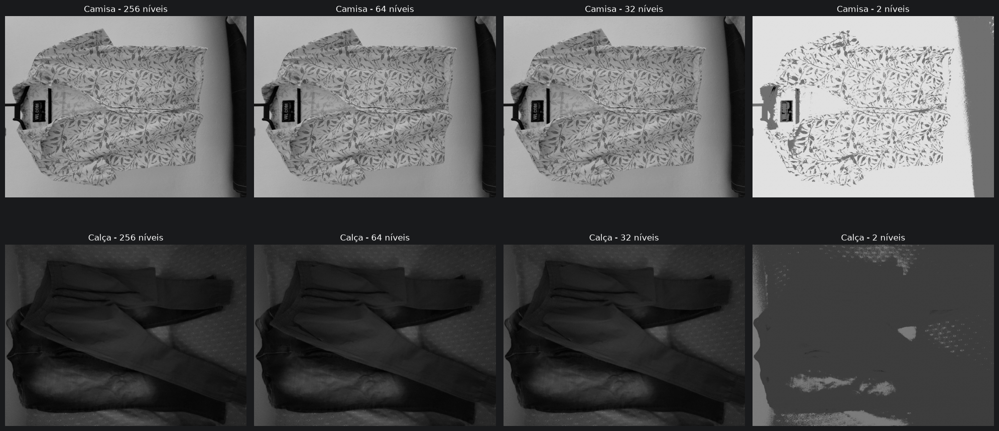

In [103]:
def quantizar_imagem(imagem: np.ndarray, niveis: int) -> np.ndarray:
    imagem_min, imagem_max = imagem.min(), imagem.max()
    passo = (imagem_min.astype(float) - imagem_max.astype(float)) / niveis
    if passo == 0:
        return imagem.copy()
    resultado = np.clip((np.floor((imagem.astype(float) - imagem_min) / passo) * passo + imagem_min), 0, 255)
    return resultado.astype(np.uint8)


imagens_quantizadas = {
    Classe.CAMISA: [
        quantizar_imagem(imagem_camisa_cinza, 256),
        quantizar_imagem(imagem_camisa_cinza, 64),
        quantizar_imagem(imagem_camisa_cinza, 32),
        quantizar_imagem(imagem_camisa_cinza, 2),
    ],
    Classe.CALCA: [
        quantizar_imagem(imagem_calca_cinza, 256),
        quantizar_imagem(imagem_calca_cinza, 64),
        quantizar_imagem(imagem_calca_cinza, 32),
        quantizar_imagem(imagem_calca_cinza, 2)
    ],
}

niveis = [256, 64, 32, 2]

fig, eixos = plt.subplots(2, 4, figsize=(20, 10))
for linha, classe in enumerate([Classe.CAMISA, Classe.CALCA]):
    for coluna, nivel in enumerate(niveis):
        eixos[linha,coluna].imshow(imagens_quantizadas[classe][coluna], cmap="gray", vmin=0, vmax=255)
        eixos[linha,coluna].set_title(f"{classe} - {nivel} níveis")
        eixos[linha,coluna].axis("off")

plt.tight_layout()
plt.show()




### Análise da quantização

Com **256 níveis**, a variação de intensidade é preservada de forma mais completa.

Em **64 níveis**, algumas diferenças de intensidade são agrupadas, mas a imagem ainda conserva boa quantidade de informação.

Com **32 níveis**, as transições entre tons ficam mais marcadas e a perda de detalhes tonais é mais perceptível.

Com **2 níveis**, a representação fica praticamente binária, preservando principalmente regiões claras e escuras. Muitos detalhes são perdidos.

Para o dataset de Camisa e Calça, **256 níveis** é a alternativa mais segura para preservar informações visuais. Quantizações menores podem ser úteis em aplicações específicas, como análise de silhuetas, segmentação ou processamento baseado principalmente em forma e contraste.

### D. Formato de Arquivo

In [87]:
Image.fromarray(imagem_camisa_rgb).save(get_caminho_output("camisa_rgb.jpg"), format="JPEG", quality=50)
Image.fromarray(imagem_camisa_rgb).save(get_caminho_output("camisa_rgb.png") , format="PNG")
tamanho_camisa_jpeg = os.path.getsize(get_caminho_output("camisa_rgb.jpg"))
tamanho_camisa_png = os.path.getsize(get_caminho_output("camisa_rgb.png"))
print(f"Imagem Camisa -> JPEG: {tamanho_camisa_jpeg} bytes")
print(f"Imagem Camisa -> PNG: {tamanho_camisa_png} bytes")

Image.fromarray(imagem_calca_rgb).save(get_caminho_output("calca_rgb.jpg"), format="JPEG", quality=50)
Image.fromarray(imagem_calca_rgb).save(get_caminho_output("calca_rgb.png") , format="PNG")
tamanho_calca_jpeg = os.path.getsize(get_caminho_output("calca_rgb.jpg"))
tamanho_calca_png = os.path.getsize(get_caminho_output("calca_rgb.png"))
print(f"Imagem Calça -> JPEG: {tamanho_calca_jpeg} bytes")
print(f"Imagem Calça -> PNG: {tamanho_calca_png} bytes")

Imagem Camisa -> JPEG: 774344 bytes
Imagem Camisa -> PNG: 12984884 bytes
Imagem Calça -> JPEG: 456817 bytes
Imagem Calça -> PNG: 8936464 bytes


##### Interpretação

No experimento, o JPEG apresentou tamanho menor que o PNG.

Isso ocorre porque o JPEG utiliza compressão com perdas, descartando parte da informação para reduzir o tamanho do arquivo. Dependendo da compressão, podem surgir artefatos em bordas, texturas e regiões detalhadas.

O PNG utiliza compressão sem perdas, preservando os pixels da imagem, porém pode gerar arquivos maiores.

Foi observado na imagem gerada em formato JPEG com compressão de 50%, que a imagem apresenta serrilhamento em baixos niveis de zoom. Alem disso, foi detectado perda de detalhes significativo nas estampas da camisa. Ao ampliar as imagens salvas em JPEG observou-se que essas imagens apresentam niveis altos de Aliasing, fazendo com que as texturas e detalhes menores nas imagens ficassem imperseptiveis.

Já as imagens armazenas em formato PNG preservou todos os detalhes da imagem original, premitindo maior profundidade de ampliação via zoom, quanto as armazenadas em JPEG com compressão de 50%.

Dependendo da tarefa de PDI, utlizar imagens JPEG com alto indice de compressão pode ser prejudicial ou custoso, pois nesse contexto a compressão cria falsas informações nos pixels, gerando ruidos na imagem. Tambem pode causar baixa nitidez em bordas, gerando borrões. Nesse caso algoritmos de segmentação e detecção podem falhar, pois ficam confusos os borrões presentes na imagem. Para solucionar alguns dos problemas causados pela compressão, pode ser necessario aplicar a imagem a processos avançados que utilizam de inteligencia artificial para corrigir os pixels, o que demanda alto poder computacional.